In [1]:
#importing essentials
import pandas as pd
import numpy as np

In [65]:
#importing the marked data
dir=''
fp=open(dir+'dataset/SCG_b6/v3_rectified_24052020_mean_a_marked.csv','r')
data_AO=[]
for i in fp.read().split('\n'):
    if i !='' :
        j=i.split(',')
        if j[0]!='amp':
            data_AO.append([round(float(j[0]),6),int(j[1])])
print('finished')

finished


In [68]:
#to check the count of data
count=0
for i in data_AO:
    if i[1]==1:
        count+=1
print(count)

317


In [69]:
#to get the AO/AC/IM index by just changing the marker
AO_data=[]
for i in range(len(data_AO)):
    if data_AO[i][1]==1:
        AO_data.append(i)

In [75]:
#to find adjacent values marked with same pointer
jkl1=[]
jkl_dup=[]
for i in range(len(jlk)-1):
    if jlk[i+1]-jlk[i]<100:
        jkl_dup.append(jlk[i])
    else:
        jkl1.append(jlk[i])

In [95]:
#to find the index of the points marked
cc=0
AC=[]
for i in range(len(data)):
    if data[i][1]==1:
        cc+=1
        AC.append(i)
print(cc)

289


In [86]:
#to find the pair of AO and AC or other points
pairs=[(i,j) for i in jkl1 for j in AC if j-i<2500 and j-i>0]

In [89]:
#the AC points which are present in pairs
AC_true=[i[1] for i in pairs]

In [91]:
#to find the points to be deleted
AC_del=[]
for i in AC:
    if i not in AC_true:
        AC_del.append(i)

In [94]:
#deleting the points
for i in AC_del:
    data[i][1]=0

In [96]:
#reversing the data for future use
data1=list(data[::-1])

In [142]:
#used for if some data is mis-interpreted 
data=list(data1[::-1])

In [198]:
#to get AO and IM points
Ao=[]
Im=[]
for i in range(len(data1)):
    if data[i][1]==1:
        Ao.append(i)
    if data[i][1]==2:
        Im.append(i)
print(len(Ao),len(Im))

289 289


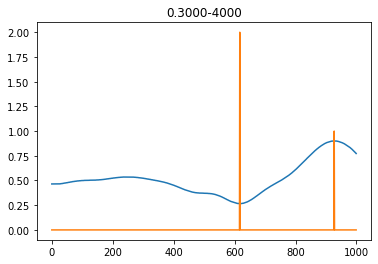

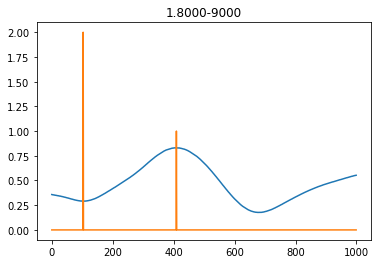

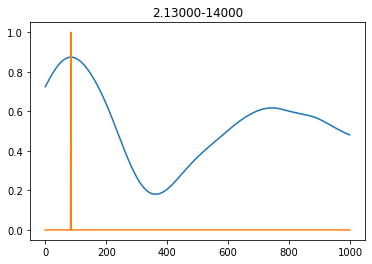

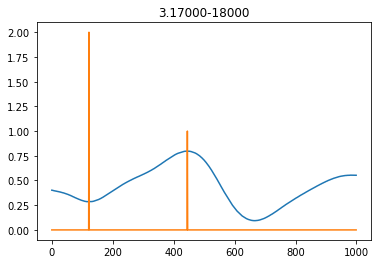

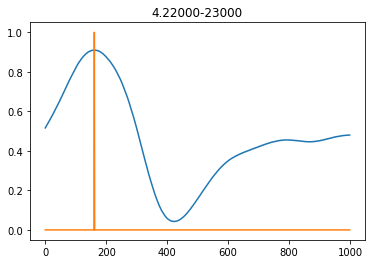

...

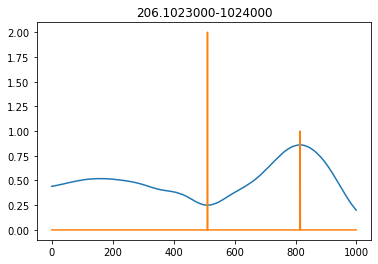

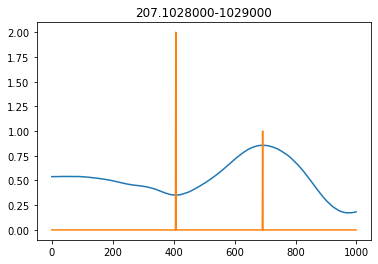

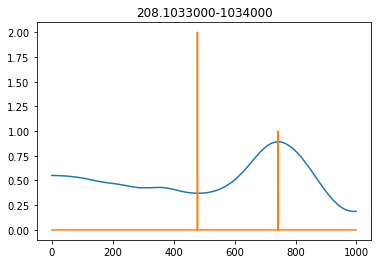

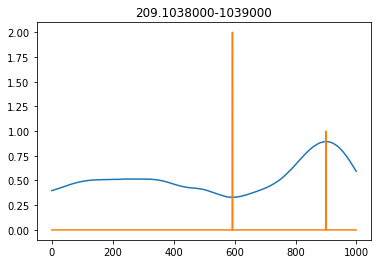

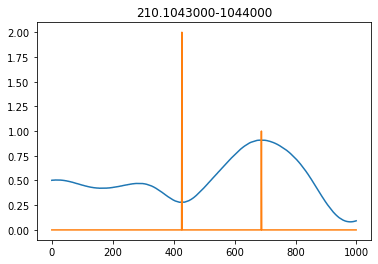

ValueError: x and y must have same first dimension, but have shapes (1000,) and (576, 2)

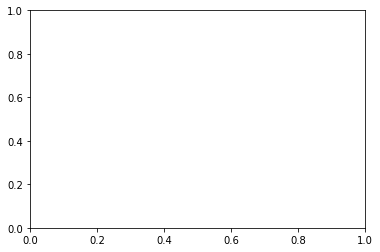

In [124]:
#plotting the points with marked values for checking error in marking 
co=0
for i in Ao:
    f=(int(i/1000))*1000
    plt.plot(range(1000),data[f:f+1000])
    plt.title(str(co)+'.'+str(f)+'-'+str(f+1000))
    co+=1
    plt.show()

In [199]:
#to eliminate all points not within the given range
within_range=[]
for i in Im:
    mj=[i]
    for j in Ao:
        if j-i<350 and j-i>90:
            mj.append(j)
    within_range.append(mj)

In [200]:
#checking the data for values having 2 IM points for a sing AO and vice versa 
wrong=0
right=[]
for i in uv:
    if len(i)==2:
        right.append(i)
    elif len(i)==1:
        wrong+=1
print(len(right),wrong)

289 0


In [201]:
#to include all the right values
ri=[]
for i in right:
    for j in i:
        ri.append(j)
print(len(ri))

578


In [202]:
#to find the element which has to be deleted
to_be_delete_Ao=[]
to_be_delete_Im=[]
for i in Ao:
    if i not in ri:
        to_be_delete_Ao.append(i)
for i in Im:
    if i not in ri:
        to_be_delete_Im.append(i)
print(len(to_be_delete_Ao),len(to_be_delete_Im))

0 0


In [196]:
#to find all the indexes to delete
to_be_delete=to_be_delete_Ao+to_be_delete_Im

In [197]:
#deleting the values
for i in to_be_delete:
    data[i][1]=0

In [99]:
#counting the no of values
count=0
for i in data:
    if i[1]==1:
        count+=1
print(count)

289


In [100]:
#appending all the data
datas=[]
for i in data:
    datas.append(i[0])

In [101]:
#finding all the downpeaks
down_peaks=[]
d_data=[]
window_size=900
for i in AC:
    d=datas[i-window_size+200:i+200]
    for j in range(10,len(d)-10):
        if min(d[j-10:j+10])==d[j]:
            down_peaks.append([d[j],(i-900+j+1)+200])
            d_data.append(d[j])

In [13]:
#exporting the downpeaks
fp=open('dataset/SCG_b6/'+'v2_downpeaks_before_AO_900_size.csv','w')
for i in down_peaks:
    fp.write(str(i[0])+','+str(i[1])+'\n')
print('finished')
fp.close()

finished


In [117]:
#enter start index and end index and rest is taken care of :)
start_index=0
end_index=1500000
td=[]
sd=[]
#finding the indexes
tu=int((end_index-start_index)/1000)
g=[]
for i in range((tu)):
    g.append(start_index+i*1000)
#getting the data for each window
for m in g:
    t=[]
    s=[]
    for i in down_peaks:
        if i[1]<m+1000 and i[1]>=m:
            t.append(i[0])
            s.append(i[1]-m)
    td.append(t)
    sd.append(s)
ju=[]
ju1=[]
#getting the value for the AC/AO/IM to plot in each window
for m in g:
    t=[]
    s=[]
    for i in AC:
        if i<m+1000 and i>=m:
            t.append(data[i])
            s.append(i-m)
    ju.append(t)
    ju1.append(s)

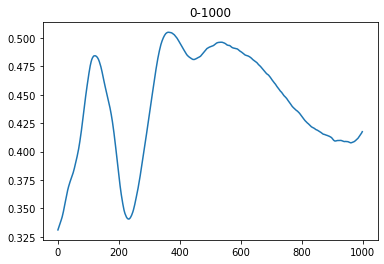

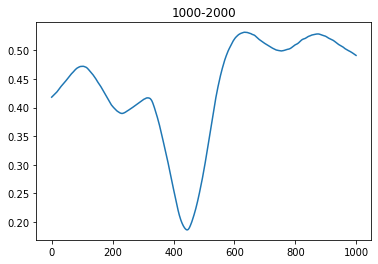

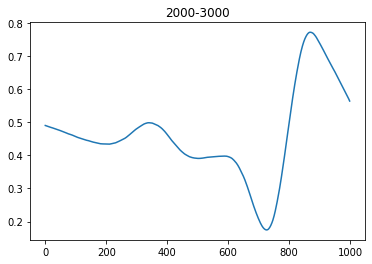

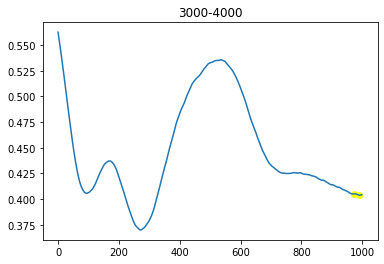

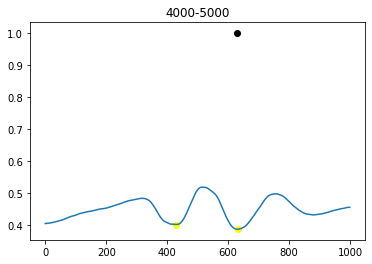

...

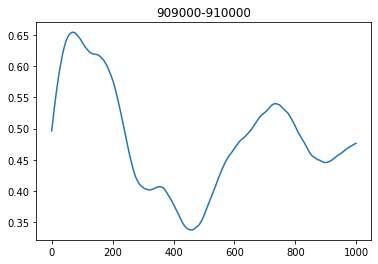

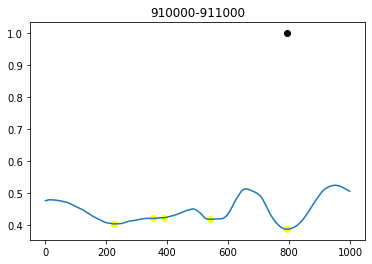

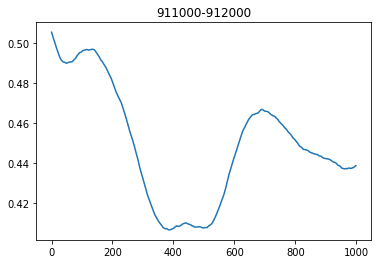

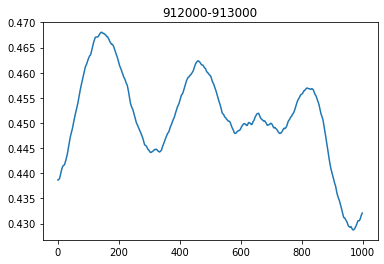

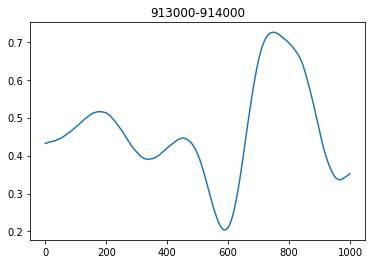

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

In [119]:
#plotting the values for cross-checking
import matplotlib.pyplot as plt
for i in range(len(g)):
    plt.figure(i)
    plt.plot(range(len(data[g[i]:g[i]+1000])),datas[g[i]:g[i]+1000])
    plt.title(str(g[i])+'-'+str(g[i]+1000))
    plt.scatter(sd[i],td[i],color='yellow')
    plt.scatter(ju1[i],ju[i],color='black')
    plt.show()

In [124]:
#marking the pt marker for the downpeaks as normal pts or IM/AC
down_peaks_IM_marked=[]
for i in down_peaks:
    jm=[]
    if i[1] not in AC  and i[1]-1 not in AC and i[1]+1 not in AC:
        jm.append(i[0])
        jm.append(i[1])
        jm.append(0)
    else:
        jm.append(i[0])
        jm.append(i[1])
        jm.append(1)
    down_peaks_IM_marked.append(jm)
print("Finished")

Finished


In [126]:
#to find all the AC values in downpeaks and counting
AC_found=[]
k=0
for i in down_peaks_IM_marked:
    if i[2]==1:
        k+=1
        AC_found.append(i)
print(k)

281


In [131]:
#getting the values only from AC tuple
AC_f=[i[1] for i in AC_found]

In [156]:
#to find all the down peaks in the specified range with AO
copy_down_peak=list(down_peaks_IM_marked)
for i in range(len(copy_down_peak)):
    for j in jkl1:
        if copy_down_peak[i][1]-j>0 and copy_down_peak[i][1]-j<=2500:
            copy_down_peak[i][1]=copy_down_peak[i][1]-j

In [161]:
#exporting the values found
fp=open('AC_marked_final_esakki.csv','w')
fp.write('Amplitude,dis_from_AO,AC_marked\n')
for i in esakki1:
    fp.write(str(i[0])+','+str(i[1])+','+str(i[2])+'\n')
fp.close()

In [149]:
#finding the AO AC pairs
AC_pair_got=[(i[0],i[1]+1) for i in pairs if i[1]+1 in AC_f]

In [61]:
#importing the IM points
fp=open('dataset/other_data/v10_esakki_downpeak_amplitude_index_starting_zero_IM_marked_900_window_size.csv')
IM=[]
for i in fp.read().split('\n'):
    if i!='':
        IM.append(i)

In [22]:
#getting the copy of down peaks
dg=list(down_peaks_IM_marked)

In [207]:
#looking for the range from AO points
dg=[]
for i in down_peaks_IM_marked:
    for j in Ao:
        if (j-i[1])<=900 and (j-i[1])>0:
            jg=list(i)
            jg[1]=j-jg[1]
            dg.append(jg)
            break;

In [185]:
#getting a copy of list
down_peaks_IM_marked=list(dg)

In [186]:
#getting the count of point like IM/AC
fm=[]
count=0
for i in down_peaks_IM_marked:
    if i[2]==1:
        count+=1
        fm.append(i[1])
print(count)

205


In [119]:
#getting all the lost points
lost_Im=[]
for i in Im:
    if i+1 not in fm:
        lost_Im.append(i)

In [52]:
#exporting all the downpeaks
fp=open('v2_esakki_downpeak_amplitude_index_starting_zero_AC_marked_900_window_size.csv','w')
fp.write("Amplitude"+','+"index"+','+"AC_mark"+'\n')
for i in down_peaks_IM_marked:
    fp.write(str(i[0])+','+str(i[1])+','+str(i[2])+'\n')
fp.close()

In [53]:
#importing the data as dataframe
import pandas as pd
df=pd.read_csv('v2_esakki_downpeak_amplitude_index_starting_zero_AC_marked_900_window_size.csv')
print(df)

      Amplitude    index  AC_mark
0      0.404923     3972        0
1      0.403719     3991        0
2      0.401310     4430        0
3      0.386462     4631        0
4      0.430960     8279        0
5      0.430318     8315        0
6      0.379905     8689        0
7      0.370376     8916        0
8      0.511603    13388        0
9      0.392230    13598        0
10     0.427470    13876        0
11     0.405854    18465        0
12     0.433043    18710        0
13     0.452865    18926        0
14     0.400035    19098        0
15     0.397161    23127        0
16     0.397161    23128        0
17     0.416262    23354        0
18     0.459291    23580        0
19     0.420948    23710        0
20     0.420948    23711        0
21     0.451459    27856        0
22     0.436269    27980        0
23     0.436304    27991        0
24     0.377927    28288        0
25     0.388492    28505        0
26     0.451899    32769        0
27     0.501820    33008        0
28     0.39420

In [56]:
#detting the data from dataframe
import pandas as pd
df=pd.read_csv('v2_esakki_downpeak_amplitude_index_starting_zero_AC_marked_900_window_size.csv')
amp=list(df['Amplitude'])
index=list(df['index'])
im=list(df['AC_mark'])

In [57]:
#to combine it into a list
data_sp=[]
for i,j,k in zip(amp,index,im):
    data_sp.append([i,j,k])
print('finished')

finished


In [58]:
#to eliminate consecutive same amplitudes
sp=[]
i=0
f=False
while(i<(len(data_sp)-1)):
    f=False
    if data_sp[i][0]==data_sp[i+1][0] and (data_sp[i][1]-data_sp[i+1][1]<3):
        if data_sp[i][2]!=1:
            i+=1
        else:
            sp.append(data_sp[i])
            i+=1
            f=True
    if f==False:
        sp.append(data_sp[i])
    i+=1

In [122]:
#exporting the clean downpeak data
fp=open('dataset/other_data/'+'v6_mohit_downpeak_amplitude_index_starting_zero_IM_marked_900_window_size.csv','w')
for i in sp:
    fp.write(str(i[0])+','+str(i[1])+','+str(i[2])+'\n')
print('finished')
fp.close()

finished
